In [1]:
# To run this notebook, first need to install this package "SPOT": https://github.com/fyz11/SPOT/tree/main
import SPOT.Features.features as SPOT_SAM_features
import os
from imageio.v2 import imread,imwrite
import matplotlib.pyplot as plt
import numpy as np
from copy import deepcopy
from tqdm import trange


In [2]:
# get all the masks of from the training dataset
base_path = "/archive/bioinformatics/Danuser_lab/shared/Yu_Felix_Roshan/Datasets/Cellpose/single_cell_imgs/train/masks"

masks = []
labels = []
all_files = []  

# masks_folder = f"{base_path}/000"
# files = [f for f in sorted(os.listdir(masks_folder)) if "incomplete" not in f]
# masks.extend([imread(os.path.join(masks_folder, f)) / 255 for f in files])
# labels.extend([0] * len(files))
# all_files.extend([os.path.join(masks_folder, f) for f in files])

for ii in trange(540):
    masks_folder = f"{base_path}/{ii:03d}"
    files = [f for f in os.listdir(masks_folder) if "incomplete" not in f]
    masks.extend([imread(os.path.join(masks_folder, f)) / 255 for f in files])
    labels.extend([ii] * len(files))
    all_files.extend([os.path.join(masks_folder, f) for f in files])

len(masks), len(labels)

100%|██████████| 540/540 [01:55<00:00,  4.68it/s]


(58120, 58120)

In [3]:
def check_closed_contour(contour, distance = 5):
    ss = contour[0]
    ee = contour[-1]
    dist = np.linalg.norm(ss-ee)
    if dist < distance:
        return True
    else:
        return False
    
from tqdm import tqdm
from skimage import io
from skimage.measure import find_contours

n_samples = 300

# SPOT inputs
all_feats = []
feature_names = []

boundaries = []
boundary_length = []

filtered_masks = []
filtered_labels = []
filtered_files = []

metrics = []
metrics_labels = []

# output_dir = "/archive/bioinformatics/Danuser_lab/shared/Yu_Felix_Roshan/paper/Fig1-cells/umap_cell_shape/cell_boundary_sanity_check"
# os.makedirs(output_dir, exist_ok=True)
# save imgs for sanity check
### filter out some shapes that are too small
for ii, mask in tqdm(enumerate(masks)):
    if np.count_nonzero(mask > 0) <= 20:    
    
        continue

    contours = find_contours(mask, level=0)
    if len(contours) > 0:
        boundary = max(contours, key=lambda x: len(x))
        
        


        boundary_length.append(len(boundary))
        boundary = SPOT_SAM_features._resample_curve(boundary[:,0], boundary[:,1], k=1, s=0, n_samples = n_samples) 
    
        assert boundary.shape == (n_samples, 2)
        if check_closed_contour(boundary):
            boundaries.append([boundary])
            filtered_masks.append(mask)
            filtered_labels.append(labels[ii])
            filtered_files.append(all_files[ii])

58120it [01:09, 831.14it/s] 


In [4]:
boundaries = np.array(boundaries)

# all_metrics = []
# for b_ii in trange(len(boundaries)):
#     contour = boundaries[b_ii][0]
#     contour_mask,bbox = SPOT_SAM_features.contour_to_binary(contour, return_bbox=True)
#     contour[:,0] = contour[:,0] - bbox[1]
#     contour[:,1] = contour[:,1] - bbox[0]
    
#     metrics_, metrics_labels, metrics_norm_bool = SPOT_SAM_features.compute_boundary_morphology_features(contour[None,None,...], 
#                                                                                                         contour_mask.shape,  
#                                                                                                         pixel_xy_res = 1)
metrics, metrics_labels, metrics_norm_bool = SPOT_SAM_features.compute_boundary_morphology_features(boundaries, 
                                                                                                    mask.shape,  
                                                                                                    pixel_xy_res = 1)
    # all_metrics.append(np.squeeze(metrics))

# all_metrics = np.vstack(all_metrics)
# metrics = all_metrics

100%|██████████| 51584/51584 [1:05:09<00:00, 13.19it/s]


In [5]:
import pickle
import os
base_path = "/work/bioinformatics/s440708/unwrap2D_paper/temporary_save_files/figure1_SPOT/2025_1227"
os.makedirs(base_path, exist_ok=True)

with open(os.path.join(base_path, 'metrics_labels.pkl'), "wb") as f:
    pickle.dump(metrics_labels, f)

with open(os.path.join(base_path, 'metrics.pkl'), "wb") as f:
    pickle.dump(metrics, f)
    
with open(os.path.join(base_path, 'boundary.pkl'), "wb") as f:
    pickle.dump(boundaries, f)

In [4]:
# Load the saved pickle file if I have already run SPOT before 
import pickle
import os
base_path = "/work/bioinformatics/s440708/unwrap2D_paper/temporary_save_files/figure1_SPOT/2025_1227"
os.makedirs(base_path, exist_ok=True)

with open(os.path.join(base_path, 'metrics_labels.pkl'), "rb") as f:
    metrics_labels = pickle.load(f)

with open(os.path.join(base_path, 'metrics.pkl'), "rb") as f:
    metrics = pickle.load(f)
    
with open(os.path.join(base_path, 'boundary.pkl'), "rb") as f:
    boundaries = pickle.load(f)

In [ ]:
import SPOT
import SPOT.Utility_Functions.file_io as fio 
import SPOT.Analysis.preprocessing as preprocess
import SPOT.Analysis.sam_analysis as SAM
import SPOT.Utility_Functions.plotting as plotting

import SPOT.Analysis.preprocessing as preprocess

all_feats = metrics.squeeze()
feature_names = metrics_labels


all_contour_feats = all_feats.copy()
all_contour_feature_names = feature_names.copy() #make copies for later. 



print("all feats shape bf preprocess:", all_feats.shape, feature_names.shape)
all_feats, feature_names = preprocess.scale_normalize_curvature_features(all_feats, 
                                                                        feature_names)
print("after scale_normalize_curvature_features:",all_feats.shape)


# all_feats, feature_names = remove_area_related_features(all_feats, feature_names)
# print("after remove area related features:", all_feats.shape, feature_names.shape)

all_feats, feature_names = preprocess.remove_zero_features(all_feats, feature_names)    
print("after remove_zero_features:",all_feats.shape)

all_feats, feature_names = preprocess.remove_high_variance_features(all_feats, 
                                                                    feature_names, 
                                                                    variance_threshold_sigma=2)
print("after remove_high_variance_features:",all_feats.shape)

all_feats, feature_names, ECT_rbf_feature_tformer = preprocess.kernel_dim_reduction_ECC_features(all_feats.astype(np.float64), 
                                                                                                feature_names, 
                                                                                                n_dim=100, 
                                                                                                gamma=None, # 1. was closer?  
                                                                                                random_state=1) # not the same? 
print("after kernel dim reduction:", all_feats.shape)


from sklearn.preprocessing import StandardScaler, power_transform
    
sd_tform = StandardScaler()
all_feats = power_transform(sd_tform.fit_transform(all_feats))

all feats shape bf preprocess: (51584, 1664) (1664,)
after scale_normalize_curvature_features: (51584, 1664)
after remove_zero_features: (51584, 1664)
after remove_high_variance_features: (51584, 1663)
after kernel dim reduction: (51584, 611)


/work/bioinformatics/s440708/conda_envs/SPOT/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-12-29 14:20:56.496341: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-12-29 14:20:56.972924: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2025-12-29 14:20:56.972962: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your 

area-related features: ['mean_kurtosis_curvature' 'max_centroid_distance'
 'mean_centroid_distance' 'max_chordal_distance' 'area' 'convex_area'
 'perimeter' 'equivalent_diameter' 'major_axis_length' 'minor_axis_length']
601


/work/bioinformatics/s440708/conda_envs/SPOT/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


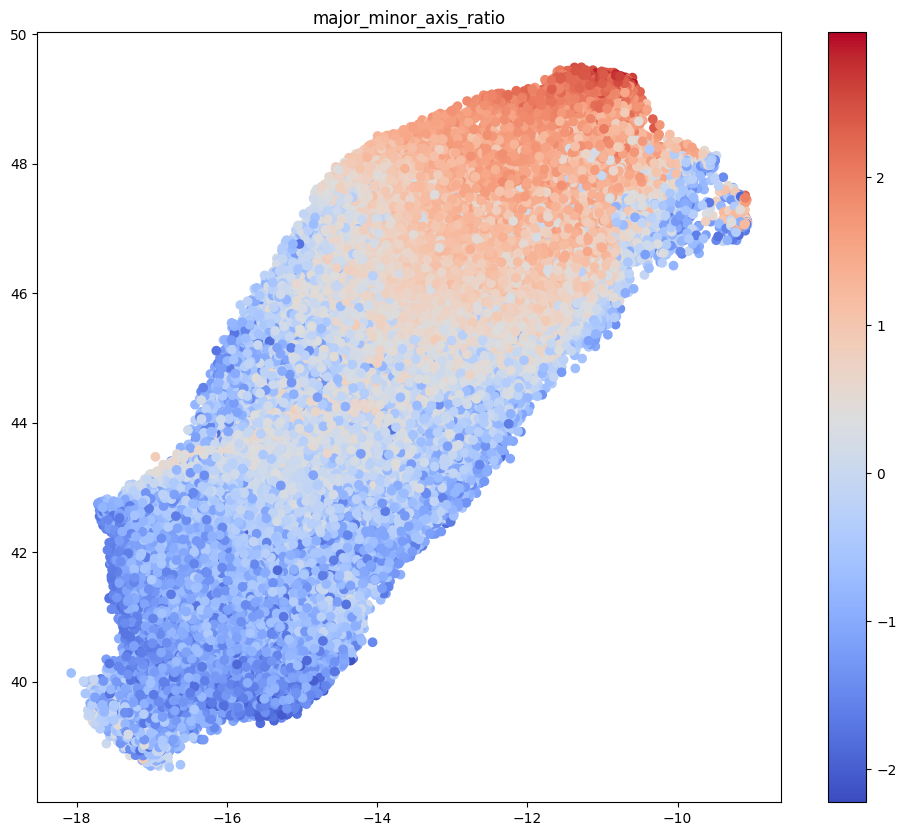

In [6]:
import scipy.stats as spstats
from umap.umap_ import UMAP
# filter out some features that is related to the shape areas (we only want to analyze shape not area)
area_feat = all_feats[:,np.where(feature_names == 'equivalent_diameter')[0][0]].copy()
corrs_area = np.hstack([spstats.pearsonr(area_feat, all_feats[:,jjj])[0] for jjj in np.arange(all_feats.shape[1])])

print('area-related features:', feature_names[np.abs(corrs_area)>0.5])


include_ids = np.arange(len(corrs_area))[np.abs(corrs_area)<=0.5]
print(len(include_ids))
all_feats_umap = all_feats[:,include_ids].copy()
feature_names_umap = feature_names[include_ids].copy()



umap_fit = UMAP(n_components=2, n_neighbors=100, 
                # min_dist=1,
                metric='euclidean', 
                #random_state=0
                ) # this seems to look better?
umap = umap_fit.fit_transform(all_feats_umap.astype(np.float64)) 
ec_idx = np.where(feature_names_umap == 'major_minor_axis_ratio')[0][0]
#ec_idx = np.where(feature_names == 'std_mean_centroid_distance_ratio')[0][0]
fig, ax = plt.subplots(figsize=(12,10))
plt.title('major_minor_axis_ratio')
sc = ax.scatter(umap[:,0], 
        umap[:,1], 
        cmap='coolwarm', 
        vmin=np.min(all_feats_umap[:,ec_idx]), vmax=np.max(all_feats_umap[:,ec_idx]),
        c=all_feats_umap[:,ec_idx]) # equivalent diameter, 25=eccentricity 
plt.colorbar(sc, ax=ax)
plt.show()

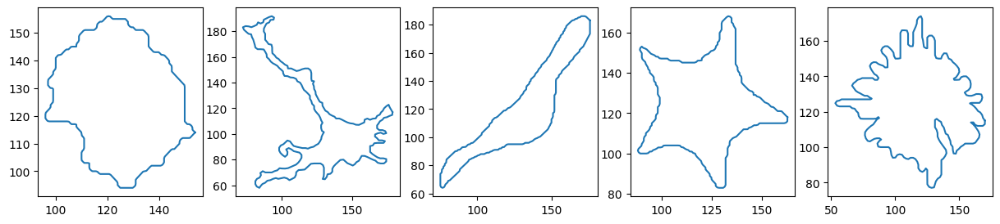

In [7]:
targets = [
    (2, "52.png"),
    (25, "41.png"),
    (161, "47.png"),
    (456, "6.png"),
    (469, "5.png")
]
base_path = "/archive/bioinformatics/Danuser_lab/shared/Yu_Felix_Roshan/Datasets/Cellpose/single_cell_imgs/train/masks"
target_indices = []
for folder_idx, filename in targets:
    target_path = f"{base_path}/{folder_idx:03d}/{filename}"
    target_indices.append(filtered_files.index(target_path))
    
fig, ax = plt.subplots(1, 5, figsize=(15, 3))
for ii in range(5):
    ax[ii].plot(boundaries[target_indices[ii]][0][:,0],boundaries[target_indices[ii]][0][:,1])
    
plt.savefig("/work/bioinformatics/s440708/unwrap2D_paper/figures/supplements/boundaries.svg")

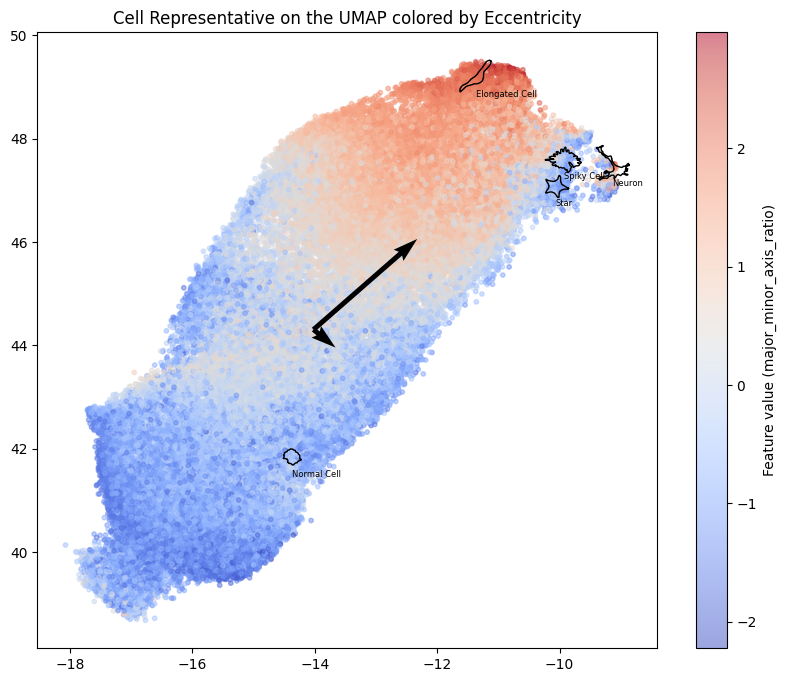

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm


fig, ax = plt.subplots(figsize=(10, 8))


sc = ax.scatter(umap[:, 0],
                umap[:, 1],
                c=all_feats_umap[:, ec_idx],
                cmap='coolwarm',
                vmin=np.min(all_feats_umap[:, ec_idx]),
                vmax=np.max(all_feats_umap[:, ec_idx]),
                alpha=0.5,
                s=10)

# ax.scatter(umap[indices, 0],
#            umap[indices, 1],
#            s=80, facecolors='none', edgecolors='black', linewidths=1.5)


annotation_text = ["Normal Cell", "Neuron", "Elongated Cell", "Star", "Spiky Cell",]
for ii, i in enumerate(target_indices):
    ax.text(umap[i, 0], umap[i, 1]-0.38,annotation_text[ii], fontsize=6, color='black')


annotation = [deepcopy(boundaries[ii]) for ii in target_indices]
scale = 200
for umap_idx, boundary in zip(target_indices, annotation):
    boundary = boundary[0]
    centroid = np.nanmean(boundary, axis=0)
    boundary = boundary - centroid[None,:]
    boundary = boundary/scale
    
    boundary = boundary + umap[umap_idx][None,:]
    plt.plot(boundary[:,0], boundary[:,1], color="black", linewidth=1)
    
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label(f'Feature value (major_minor_axis_ratio)')



ecc_feats = all_feats_umap[:,np.argwhere(feature_names=='major_minor_axis_ratio')[0][0]]

# =============================================================================
# =============================================================================
# # Fitting a line through the umap 
# =============================================================================
# =============================================================================
# cov_umap = (umap_sa-umap_sa.mean(axis=0)).T.dot((umap_sa-umap_sa.mean(axis=0)))
norm_umap = (umap-umap.mean(axis=0)[None,:])
norm_umap = norm_umap / (np.linalg.norm(norm_umap, axis=-1)+1e-20)[:,None]
cov_umap = (norm_umap*ecc_feats[:,None]).T.dot(ecc_feats[:,None]*norm_umap)
eigenvals, eigenvectors = np.linalg.eigh(cov_umap)

sort_order = np.argsort(np.abs(eigenvals))
principal_eigenvector_1 = eigenvectors[:,sort_order[-1]]


arrow_length_ratio = np.abs(eigenvals[-1]) / np.abs(eigenvals[-2])
arrow_length = 0.1*arrow_length_ratio

center = umap.mean(axis=0)
vec = principal_eigenvector_1
vec = vec / np.linalg.norm(vec)


ax.quiver(
    center[0], center[1],
    vec[0], vec[1],
    angles='xy',
    scale_units='xy',
    scale=1/arrow_length,
    color='black',
    width=0.008,
    zorder=5
)



arrow_length = 0.5
principal_eigenvector_2 = -eigenvectors[:,sort_order[-2]]

center = umap.mean(axis=0)
vec = principal_eigenvector_2
vec = vec / np.linalg.norm(vec)


ax.quiver(
    center[0], center[1],
    vec[0], vec[1],
    angles='xy',
    scale_units='xy',
    scale=1/arrow_length,
    color='black',
    width=0.008,
    zorder=5
)

plt.title('Cell Representative on the UMAP colored by Eccentricity')
plt.savefig("/archive/bioinformatics/Danuser_lab/shared/Yu_Felix_Roshan/1_Paper_All_Reproducibility_Files/Figure_1/SPOT/umap_spot.svg")
plt.show()

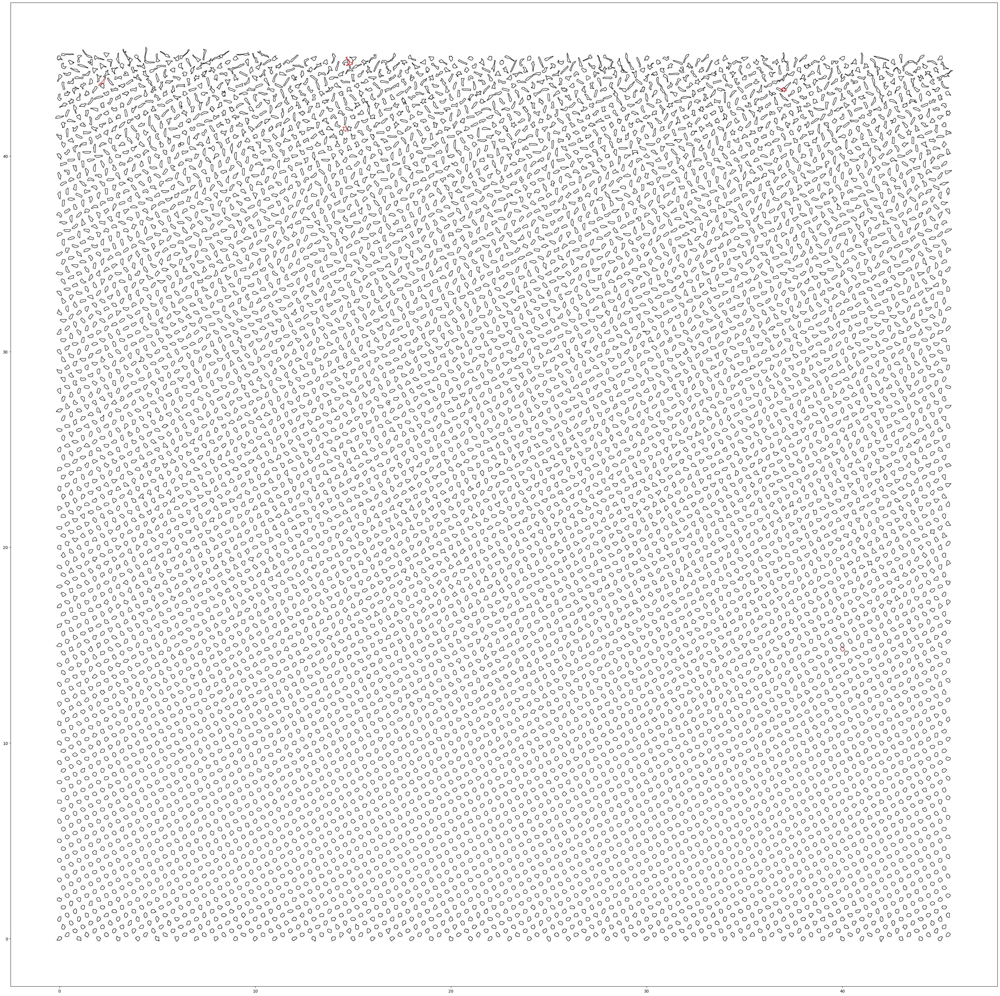

In [15]:
## calculate the score based on the first two eigen vector projections


umap_centered = umap - umap.mean(axis=0, keepdims=True)

order = np.argsort(np.abs(eigenvals))[::-1]
v1 = eigenvectors[:, order[0]]
v2 = -eigenvectors[:, order[1]]

v1 = v1 / np.linalg.norm(v1)
v2 = v2 / np.linalg.norm(v2)

proj_1 = umap_centered @ v1   
proj_2 = umap_centered @ v2   



umap_score = (
    eigenvals[order[0]] * proj_1 +
    eigenvals[order[1]] * proj_2
)


scale = 10
normalized_contours = []

for c_ii in range(len(boundaries)):
    b = boundaries[c_ii][0]

    centroid = np.nanmean(b, axis=0)
    b = b - centroid[None, :]

    b /= (all_contour_feats[:, 23][c_ii] / 2.0 + 1e-8)
    b /= scale

    normalized_contours.append(b)

normalized_contours = np.array(normalized_contours, dtype=object)



sort_order = np.argsort(umap_score)
grid_size = int(np.ceil(np.sqrt(len(umap))))


target_indices_list = np.array([],dtype=int)
fig, ax = plt.subplots(figsize=(35, 35))

for order_ii, cell_idx in enumerate(sort_order):

    x_offset = np.mod(order_ii, grid_size) * 0.2
    y_offset = (order_ii // grid_size) * 0.2

    contour = normalized_contours[cell_idx]

    if cell_idx in target_indices:
        ax.plot(
            x_offset + contour[:, 0],
            y_offset + contour[:, 1],
            color='red',
            linewidth=1
        )
     
    else:
        if order_ii % 5 == 0 and cell_idx not in target_indices:
            ax.plot(
                x_offset + contour[:, 0],
                y_offset + contour[:, 1],
                color='black',
                linewidth=1
            )

ax.set_aspect('equal')
plt.tight_layout()

output_dir = '/archive/bioinformatics/Danuser_lab/shared/Yu_Felix_Roshan/1_Paper_All_Reproducibility_Files/Figure_1/SPOT'
os.makedirs(output_dir, exist_ok=True)

plt.savefig(
    os.path.join(output_dir, 'contour_viz_sorted_by_umap_score.svg'),
    dpi=600,
    bbox_inches='tight'
)

plt.show()


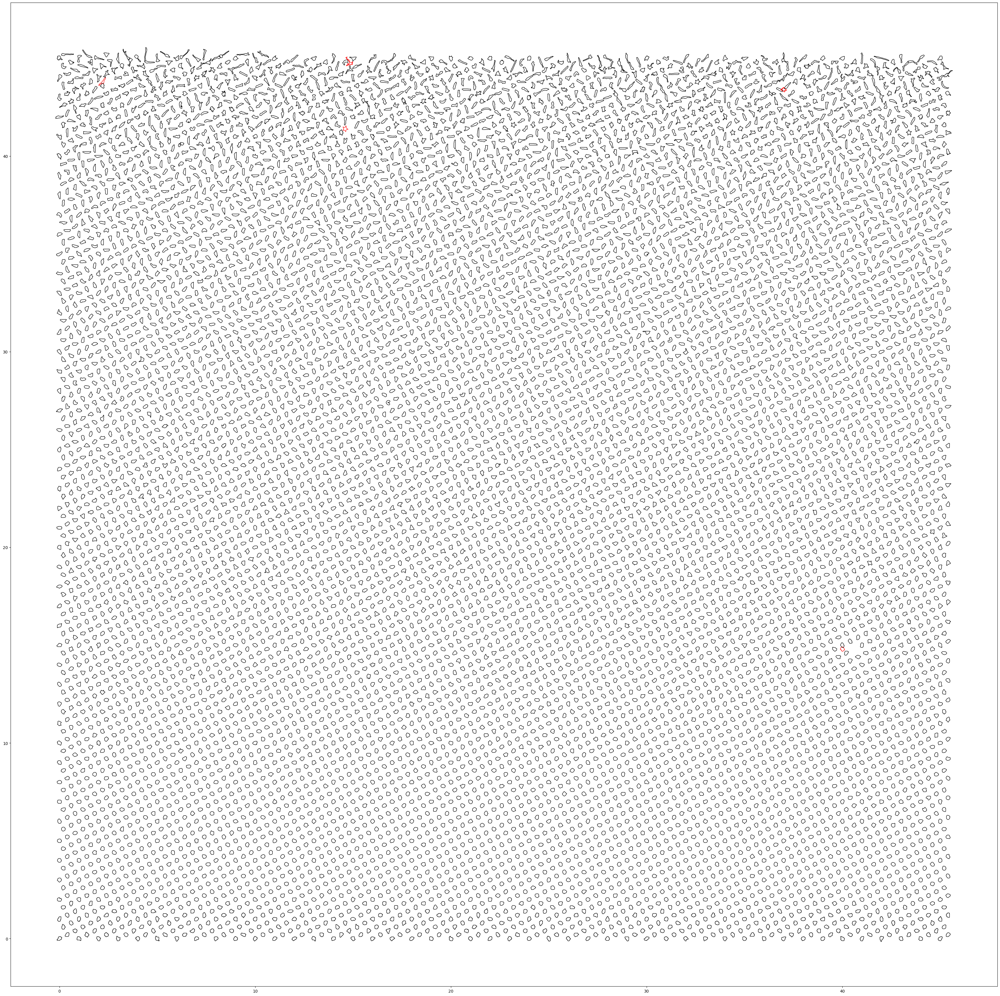

In [14]:
## calculate the score based on the first two eigen vector projections

umap_centered = umap - umap.mean(axis=0, keepdims=True)

order = np.argsort(np.abs(eigenvals))[::-1]
v1 = eigenvectors[:, order[0]]
v2 = -eigenvectors[:, order[1]]

v1 = v1 / np.linalg.norm(v1)
v2 = v2 / np.linalg.norm(v2)

proj_1 = umap_centered @ v1
proj_2 = umap_centered @ v2

umap_score = (
    eigenvals[order[0]] * proj_1 +
    eigenvals[order[1]] * proj_2
)

scale = 10
normalized_contours = []

for c_ii in range(len(boundaries)):
    b = boundaries[c_ii][0]

    centroid = np.nanmean(b, axis=0)
    b = b - centroid[None, :]

    b /= (all_contour_feats[:, 23][c_ii] / 2.0 + 1e-8)
    b /= scale

    normalized_contours.append(b)

normalized_contours = np.array(normalized_contours, dtype=object)

sort_order = np.argsort(umap_score)
grid_size = int(np.ceil(np.sqrt(len(umap))))


target_indices_list = []

fig, ax = plt.subplots(figsize=(35, 35))

for order_ii, cell_idx in enumerate(sort_order):

    x_offset = np.mod(order_ii, grid_size) * 0.2
    y_offset = (order_ii // grid_size) * 0.2

    contour = normalized_contours[cell_idx]

    if cell_idx in target_indices:
        ax.plot(
            x_offset + contour[:, 0],
            y_offset + contour[:, 1],
            color='red',
            linewidth=1
        )
  
        target_indices_list.append(order_ii)

    else:
        if order_ii % 5 == 0:
     
            if (
                len(target_indices_list) == 0 or
                min(abs(order_ii - t) for t in target_indices_list) > 5
            ):
                ax.plot(
                    x_offset + contour[:, 0],
                    y_offset + contour[:, 1],
                    color='black',
                    linewidth=1
                )

ax.set_aspect('equal')
plt.tight_layout()

output_dir = '/archive/bioinformatics/Danuser_lab/shared/Yu_Felix_Roshan/1_Paper_All_Reproducibility_Files/Figure_1/SPOT'
os.makedirs(output_dir, exist_ok=True)

plt.savefig(
    os.path.join(output_dir, 'contour_viz_sorted_by_umap_score.svg'),
    dpi=600,
    bbox_inches='tight'
)

plt.show()
